### Part I: Data Analysis & Preprocessing


In [124]:
# !pwd
!pip install utils

In [125]:
#1
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle

In [126]:
from google.colab import drive
drive.mount('/content/drive')
%cd ..
%cd /content/drive/MyDrive

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive
/content/drive/MyDrive


In [127]:
#2
#readign dataset #1
df = pd.read_csv("penguins.csv")
print(df.head())
print(df.dtypes)

  species     island  calorie requirement  average sleep duration  \
0  Adelie  Torgersen                 6563                      11   
1  Adelie  Torgersen                 4890                      14   
2  Adelie  Torgersen                 7184                      11   
3  Adelie  Torgersen                 4169                       8   
4  Adelie  Torgersen                 4774                       8   

   bill_length_mm  bill_depth_mm  flipper_length_mm  body_mass_g  gender  \
0            39.1           18.7              181.0       3750.0    male   
1            39.5           17.4              186.0       3800.0  female   
2            40.3           18.0              195.0       3250.0  female   
3             NaN            NaN                NaN        992.0     NaN   
4            36.7           19.3              193.0       3450.0  female   

     year  
0  2007.0  
1  2007.0  
2  2007.0  
3  2007.0  
4  2007.0  
species                    object
island                

In [128]:
df

,species,island,calorie requirement,average sleep duration,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,gender,year
0,Adelie,Torgersen,6563,11,39.1,18.7,181.0,3750.0,male,2007.0
1,Adelie,Torgersen,4890,14,39.5,17.4,186.0,3800.0,female,2007.0
2,Adelie,Torgersen,7184,11,40.3,18.0,195.0,3250.0,female,2007.0
3,Adelie,Torgersen,4169,8,NaN,NaN,NaN,992.0,NaN,2007.0
4,Adelie,Torgersen,4774,8,36.7,19.3,193.0,3450.0,female,2007.0
...,...,...,...,...,...,...,...,...,...,...
339,Chinstrap,Dream,4826,11,55.8,19.8,207.0,4000.0,male,2009.0
340,Chinstrap,Dream,4111,9,43.5,18.1,202.0,3400.0,female,2009.0
341,Chinstrap,Dream,7049,10,49.6,18.2,193.0,3775.0,male,2009.0
342,Chinstrap,Dream,4705,7,50.8,19.0,210.0,4100.0,male,2009.0


In [129]:
#2 mean,median and mode
#From Rebecca Abraham's assignement A0 reusing the code to get stastics

mean_values = df.mean(numeric_only=True)
print("The mean values:",mean_values,sep='\n')
print('\n')

median_values = df.median(numeric_only=True)
print("The median values:",median_values,sep='\n')
print('\n')

mode_values = df.mode(numeric_only=True)
print("The mode values:",mode_values,sep='\n')
print('\n')

standard_deviation = df.std(numeric_only=True)
print("The standard deviation values:",standard_deviation,sep='\n')
print('\n')

variance_values = df.var(numeric_only=True)
print("The variance values:",variance_values,sep='\n')
print('\n')

min_values = df.min(numeric_only=True)
print("The min values:",min_values,sep='\n')
print('\n')

max_values = df.max(numeric_only=True)
print("The max values:",max_values,sep='\n')
print('\n')


The mean values:
calorie requirement       5270.002907
average sleep duration      10.447674
bill_length_mm              45.494214
bill_depth_mm               18.018318
flipper_length_mm          197.764881
body_mass_g               4175.463127
year                      2008.035088
dtype: float64


The median values:
calorie requirement       5106.5
average sleep duration      10.0
bill_length_mm              45.1
bill_depth_mm               17.3
flipper_length_mm          197.0
body_mass_g               4050.0
year                      2008.0
dtype: float64


The mode values:
    calorie requirement  average sleep duration  bill_length_mm  \
0                  3916                     9.0            41.1   
1                  4315                     NaN            45.2   
2                  4403                     NaN             NaN   
3                  4439                     NaN             NaN   
4                  4658                     NaN             NaN   
5             

In [130]:
#3
#preprocessing the data
df.drop_duplicates(inplace=True)

missing_values = df.isnull().sum()
print("Missing Values:\n", missing_values)

df['bill_length_mm'].fillna(df['bill_length_mm'].mean(),inplace=True)
df['bill_depth_mm'].fillna(df['bill_depth_mm'].mean(),inplace=True)
df['flipper_length_mm'].fillna(df['flipper_length_mm'].mode()[0],inplace=True)
df['body_mass_g'].fillna(df['body_mass_g'].mode()[0],inplace=True)
df['year'].fillna(df['year'].mode()[0],inplace=True)

df['gender'].ffill(inplace=True)
df['species'].ffill(inplace=True)
df['island'].ffill(inplace=True)

missing_values = df.isnull().sum()
print("Missing Values:\n", missing_values)

print(df)

Missing Values:
 species                   11
island                    10
calorie requirement        0
average sleep duration     0
bill_length_mm             7
bill_depth_mm             11
flipper_length_mm          8
body_mass_g                5
gender                    17
year                       2
dtype: int64
Missing Values:
 species                   0
island                    0
calorie requirement       0
average sleep duration    0
bill_length_mm            0
bill_depth_mm             0
flipper_length_mm         0
body_mass_g               0
gender                    0
year                      0
dtype: int64
       species     island  calorie requirement  average sleep duration  \
0       Adelie  Torgersen                 6563                      11   
1       Adelie  Torgersen                 4890                      14   
2       Adelie  Torgersen                 7184                      11   
3       Adelie  Torgersen                 4169                       8   


<ipython-input-130-4d9723707f94>:8: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['bill_length_mm'].fillna(df['bill_length_mm'].mean(),inplace=True)
<ipython-input-130-4d9723707f94>:9: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, i

In [131]:
#4 and #8
#making all the strings standarized format using title() and stripping any leading and trailing white spaces
columns_string = ['species', 'island', 'gender']

for item in columns_string:
  df[item] = df[item].str.title()
  df[item] = df[item].str.strip()

#converting specices, island and gender to categorical
#Create dummy variables
categorical_data = pd.get_dummies(df, columns=['species','island','gender'])

# df = pd.concat([df[['species', 'island', 'gender']],dummies])

# print(df.dtypes)
print(df)

       species     island  calorie requirement  average sleep duration  \
0       Adelie  Torgersen                 6563                      11   
1       Adelie  Torgersen                 4890                      14   
2       Adelie  Torgersen                 7184                      11   
3       Adelie  Torgersen                 4169                       8   
4       Adelie  Torgersen                 4774                       8   
..         ...        ...                  ...                     ...   
339  Chinstrap      Dream                 4826                      11   
340  Chinstrap      Dream                 4111                       9   
341  Chinstrap      Dream                 7049                      10   
342  Chinstrap      Dream                 4705                       7   
343  Chinstrap      Dream                 6098                       7   

     bill_length_mm  bill_depth_mm  flipper_length_mm  body_mass_g  gender  \
0         39.100000      18.70000

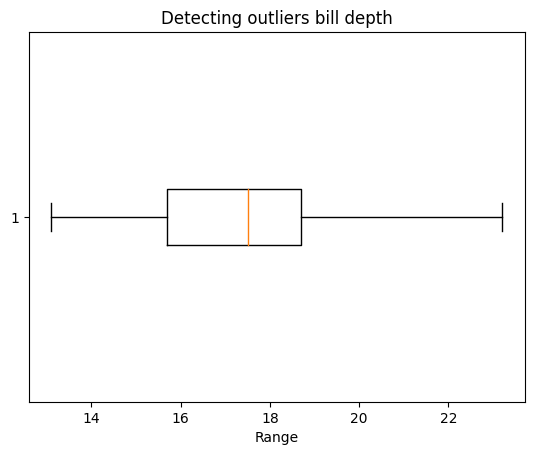

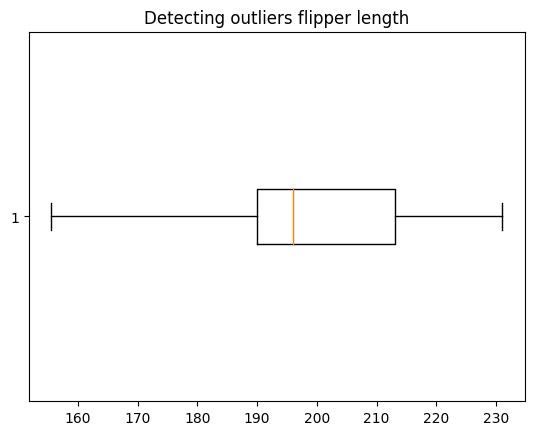

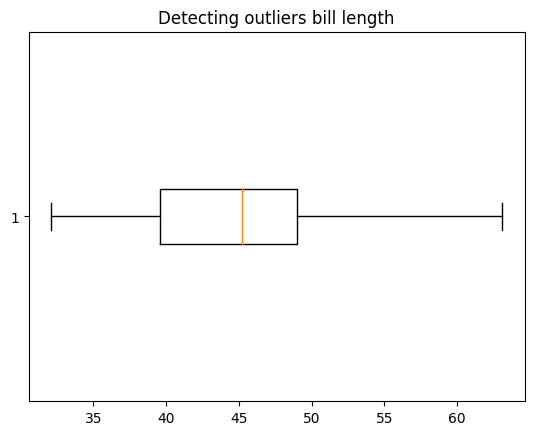

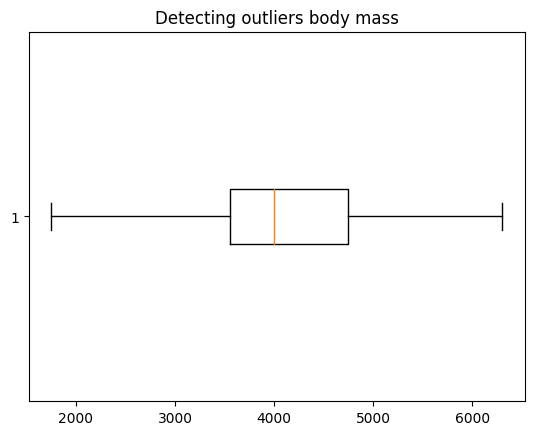

In [132]:
#5
#fixing outliers using the interquartile method and clip()
#for flipper length, bill depth, bill length and body mass

columns = ['flipper_length_mm','bill_depth_mm','bill_length_mm','body_mass_g']

for col in columns:
  q1 = df[col].quantile(0.25)
  q3 = df[col].quantile(0.75)

  inter_quatile_rng = q3 - q1
  lower_bound = q3 + (1.5 * inter_quatile_rng)
  upper_bound = q1 - (1.5 * inter_quatile_rng)

  df[col] = df[col].clip(lower_bound,upper_bound)

#
# q1 = df['flipper_length_mm'].quantile(0.25)
# q3 = df['flipper_length_mm'].quantile(0.75)

# inter_quatile_rng = q3 - q1
# lower_bound = q3 + (1.5 * inter_quatile_rng)
# upper_bound = q1 - (1.5 * inter_quatile_rng)

# df['flipper_length_mm'] = df['flipper_length_mm'].clip(lower_bound,upper_bound)

# # for bill depth
# q1 = df['bill_depth_mm'].quantile(0.25)
# q3 = df['bill_depth_mm'].quantile(0.75)

# inter_quatile_rng = q3 - q1
# lower_bound = q3 + (1.5 * inter_quatile_rng)
# upper_bound = q1 - (1.5 * inter_quatile_rng)

# df['bill_depth_mm'] = df['bill_depth_mm'].clip(lower=lower_bound, upper=upper_bound)

# # for bill length
# q1 = df['bill_length_mm'].quantile(0.25)
# q3 = df['bill_length_mm'].quantile(0.75)

# inter_quatile_rng = q3 - q1
# lower_bound = q3 + (1.5 * inter_quatile_rng)
# upper_bound = q1 - (1.5 * inter_quatile_rng)

# df['bill_length_mm'] = df['bill_length_mm'].clip(lower_bound, upper_bound)

# # for body mass
# q1 = df['body_mass_g'].quantile(0.25)
# q3 = df['body_mass_g'].quantile(0.75)

# inter_quatile_rng = q3 - q1
# lower_bound = q3 + (1.5 * inter_quatile_rng)
# upper_bound = q1 - (1.5 * inter_quatile_rng)

# df['body_mass_g'] = df['body_mass_g'].clip(lower_bound, upper_bound)


#to check if the oultiers are fixed
plt.boxplot(df['bill_depth_mm'], vert=False)
plt.title("Detecting outliers bill depth")
plt.xlabel('Range')
plt.show()

plt.boxplot(df['flipper_length_mm'], vert=False)
plt.title("Detecting outliers flipper length")
plt.show()

plt.boxplot(df['bill_length_mm'], vert=False)
plt.title("Detecting outliers bill length")
plt.show()

plt.boxplot(df['body_mass_g'], vert=False)
plt.title("Detecting outliers body mass")
plt.show()




In [133]:
#9
#normalize the non-categorical data (using code from A0)

#using the columns array from above
for col in columns:
  min_value = df[col].min()
  max_value = df[col].max()

  df[col] = (df[col] - min_value) / (max_value - min_value)


#normalizing the int datatype
min_value = df['calorie requirement'].min()
max_value = df['calorie requirement'].max()

df['normalized_calorieRequirement'] = (df['calorie requirement'] - min_value) / (max_value - min_value)

min_value = df['average sleep duration'].min()
max_value = df['average sleep duration'].max()

df['normalized_sleepDuration'] = (df['average sleep duration'] - min_value) / (max_value - min_value)

df[:5]

,species,island,calorie requirement,average sleep duration,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,gender,year,normalized_calorieRequirement,normalized_sleepDuration
0,Adelie,Torgersen,6563,11,0.225806,0.554455,0.337748,0.439560,Male,2007.0,0.828324,0.571429
1,Adelie,Torgersen,4890,14,0.238710,0.425743,0.403974,0.450549,Female,2007.0,0.375305,1.000000
2,Adelie,Torgersen,7184,11,0.264516,0.485149,0.523179,0.329670,Female,2007.0,0.996480,0.571429
3,Adelie,Torgersen,4169,8,0.432071,0.486962,0.456954,0.000000,Female,2007.0,0.180070,0.142857
4,Adelie,Torgersen,4774,8,0.148387,0.613861,0.496689,0.373626,Female,2007.0,0.343894,0.142857


VISUALIZATION GRAPHS


In [134]:
df.head()

,species,island,calorie requirement,average sleep duration,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,gender,year,normalized_calorieRequirement,normalized_sleepDuration
0,Adelie,Torgersen,6563,11,0.225806,0.554455,0.337748,0.439560,Male,2007.0,0.828324,0.571429
1,Adelie,Torgersen,4890,14,0.238710,0.425743,0.403974,0.450549,Female,2007.0,0.375305,1.000000
2,Adelie,Torgersen,7184,11,0.264516,0.485149,0.523179,0.329670,Female,2007.0,0.996480,0.571429
3,Adelie,Torgersen,4169,8,0.432071,0.486962,0.456954,0.000000,Female,2007.0,0.180070,0.142857
4,Adelie,Torgersen,4774,8,0.148387,0.613861,0.496689,0.373626,Female,2007.0,0.343894,0.142857


Graph 1

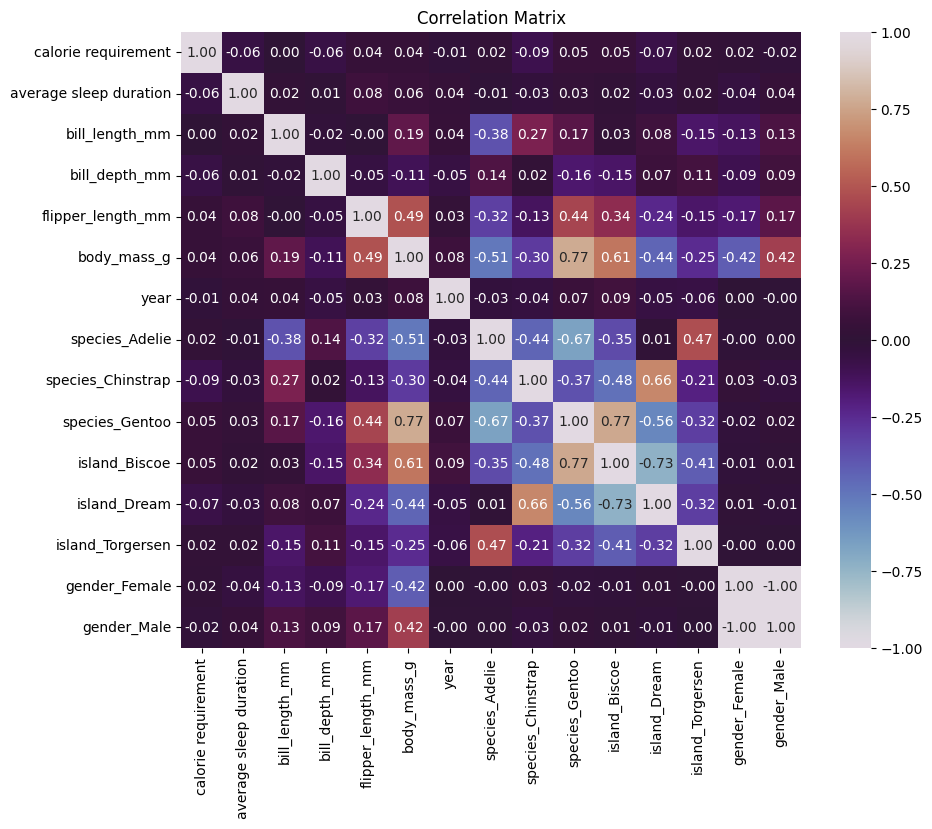

In [135]:
#7
#using the corr() function to understand the correlation.
#using the dataframe after doing encoding
matrix = categorical_data.corr()

#plotting the correlation matrix using seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(matrix, annot=True, cmap='twilight', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()


Graph 2

array([[<Axes: title={'center': 'calorie requirement'}>,
        <Axes: title={'center': 'average sleep duration'}>,
        <Axes: title={'center': 'bill_length_mm'}>],
       [<Axes: title={'center': 'bill_depth_mm'}>,
        <Axes: title={'center': 'flipper_length_mm'}>,
        <Axes: title={'center': 'body_mass_g'}>],
       [<Axes: title={'center': 'year'}>, <Axes: >, <Axes: >]],
      dtype=object)

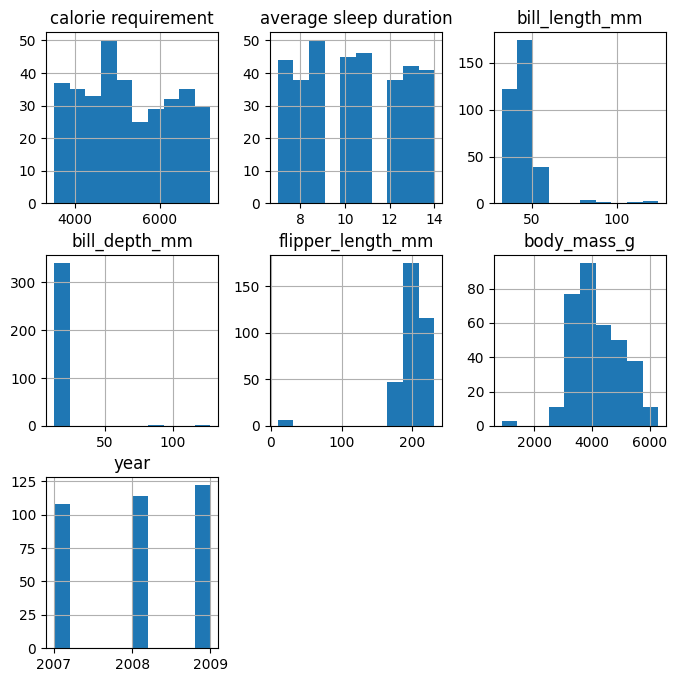

In [136]:
#plotting different and their frequceny categorical_data dataframe
categorical_data.hist(figsize=(8,8))

Graph 3

Text(0.5, 1.0, 'Species by Body Mass & Gender')

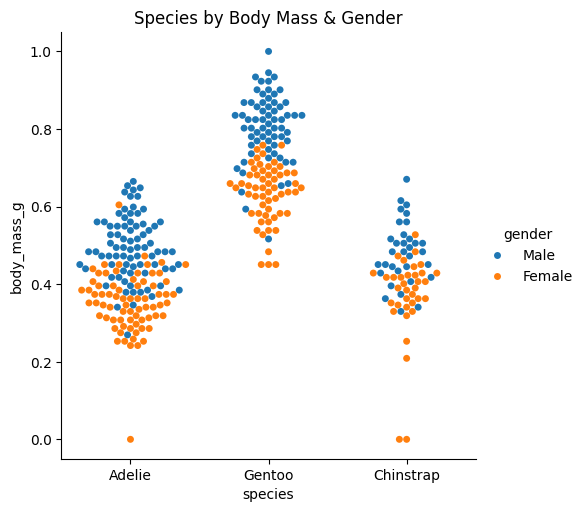

In [137]:
#plotting the body mass in relation to the species and gender
sns.catplot(data=df, x="species", y="body_mass_g", hue="gender", kind="swarm")
plt.title("Species by Body Mass & Gender")

Graph 4

species_Gentoo  island_Biscoe
False           False            176
                True              44
True            True             124
Name: count, dtype: int64


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3399: UserWarning: 16.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


Text(0.5, 1.0, 'Average Sleep Duration for Gentoo Species based on Island Biscoe')

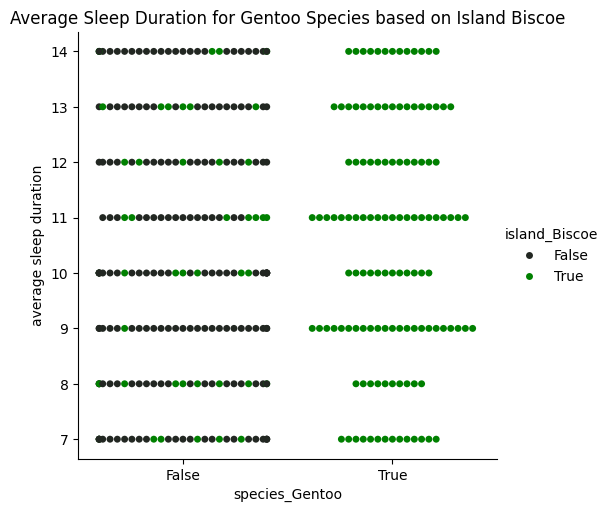

In [138]:
grouped = categorical_data.groupby('species_Gentoo')['island_Biscoe'].value_counts()
print(grouped)
sns.catplot(data=categorical_data, x="species_Gentoo", y="average sleep duration", hue="island_Biscoe", kind="swarm",palette='dark:green')
plt.title("Average Sleep Duration for Gentoo Species based on Island Biscoe")

Graph 5

island_Torgersen  year    species_Adelie
False             2009.0  False             70
                  2008.0  False             64
                  2007.0  False             58
                  2009.0  True              36
                  2008.0  True              34
                  2007.0  True              30
True              2007.0  True              20
                  2008.0  True              16
                  2009.0  True              16
Name: count, dtype: int64


Text(0.5, 1.0, 'Chart based on (Island Torgersen, Year, Adelie Species)')

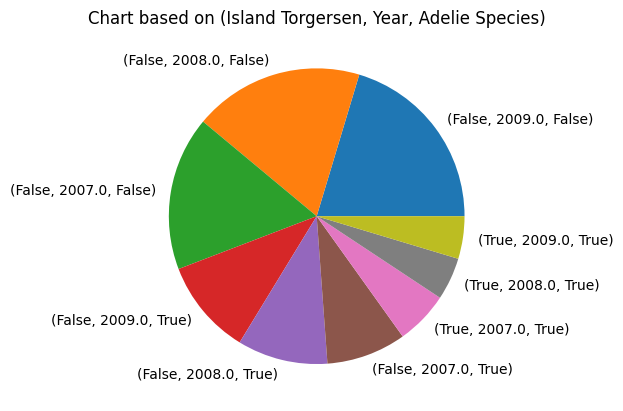

In [139]:
grouped = categorical_data.groupby('island_Torgersen')[['year','species_Adelie']].value_counts()
print(grouped)

plt.pie(grouped,labels=grouped.index)
plt.title("Chart based on (Island Torgersen, Year, Adelie Species)")

### Part II: Logistic Regression using Gradient Descent

In [140]:
import math
from utils import *

In [141]:
categorical_data['species_Adelie']= categorical_data['species_Adelie'].astype(float)
categorical_data.dtypes

,0
calorie requirement,int64
average sleep duration,int64
bill_length_mm,float64
bill_depth_mm,float64
flipper_length_mm,float64
body_mass_g,float64
year,float64
species_Adelie,float64
species_Chinstrap,bool
species_Gentoo,bool


In [142]:
y = categorical_data['island_Torgersen']
# y.values.reshape(len(y), 1)
print(y.shape)

X = categorical_data[['bill_depth_mm','bill_length_mm','body_mass_g','species_Adelie','flipper_length_mm']].values

print(X.shape)
# print(categorical_data.dtypes)

(344,)
(344, 5)


In [143]:

samples = X.shape[0]
train_size = int(samples*0.8) #80% training and 20% testing
# print(samples)
# print(train_size)
# Split data into test and train
# train = df[0:train_size]
# test = df[train_size:]

#spit it 80/20
X_train = X[0:train_size]
y_train = y[0:train_size].values.reshape(-1,1)
X_test = X[train_size:]
y_test = y[train_size:].values.reshape(-1,1)

print("X_train shape:",X_train.shape)
print("y_train shape:",y_train.shape)
print("X_test shape:",X_test.shape)
print("y_test shape:",y_test.shape)

X_train shape: (275, 5)
y_train shape: (275, 1)
X_test shape: (69, 5)
y_test shape: (69, 1)


<ipython-input-144-e8c72096dc48>:17: RuntimeWarning: divide by zero encountered in log
  objective_function = -(1/N) * np.sum(((y) * np.log(h)) + [(1-y) * np.log(1 - h)])
<ipython-input-144-e8c72096dc48>:17: RuntimeWarning: invalid value encountered in multiply
  objective_function = -(1/N) * np.sum(((y) * np.log(h)) + [(1-y) * np.log(1 - h)])
<ipython-input-144-e8c72096dc48>:12: RuntimeWarning: overflow encountered in exp
  sigmaFunc = 1 / (1 + np.exp(-z))


The learning Rate: 0.001, The iterations: 100000, The accuracy: 97.10%
[nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan

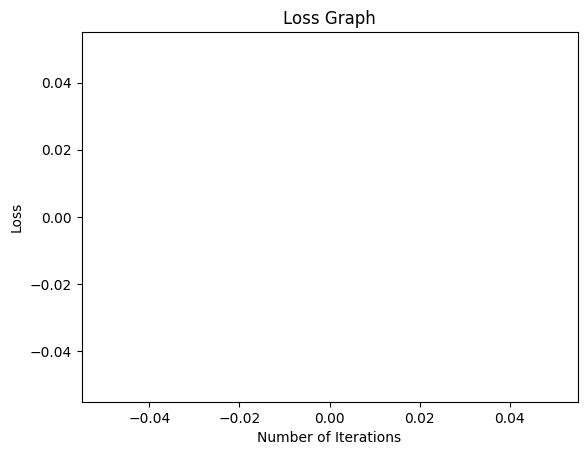

The learning Rate: 0.001, The iterations: 30000, The accuracy: 78.26%
[nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,

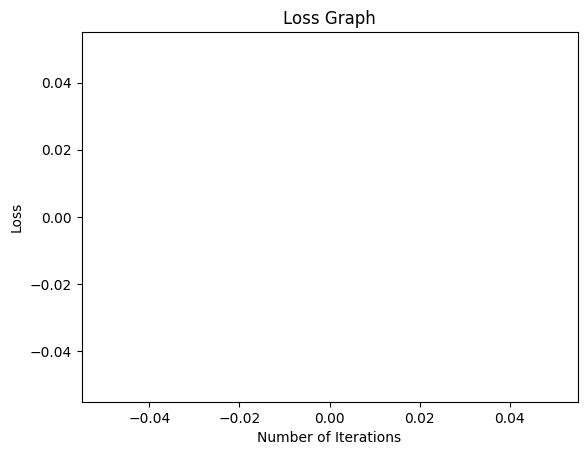

The learning Rate: 0.001, The iterations: 50000, The accuracy: 90.14%
[nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,

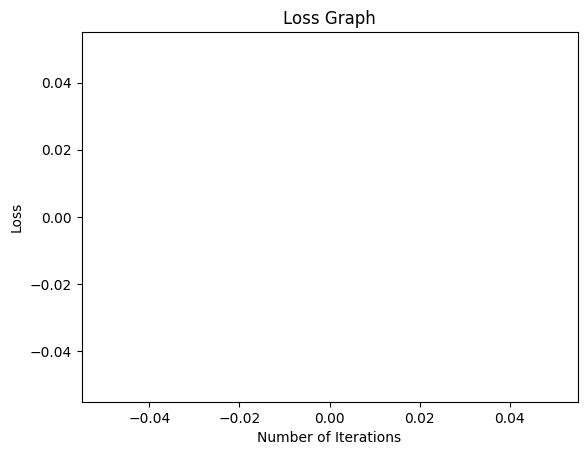

The learning Rate: 0.0001, The iterations: 100000, The accuracy: 96.23%
[nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, na

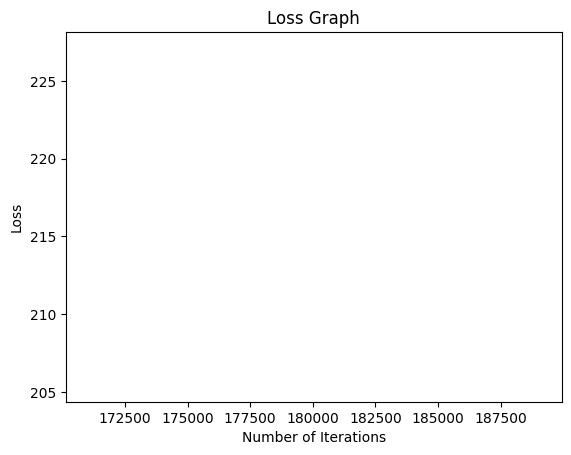

The learning Rate: 0.0001, The iterations: 30000, The accuracy: 78.26%
[nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan

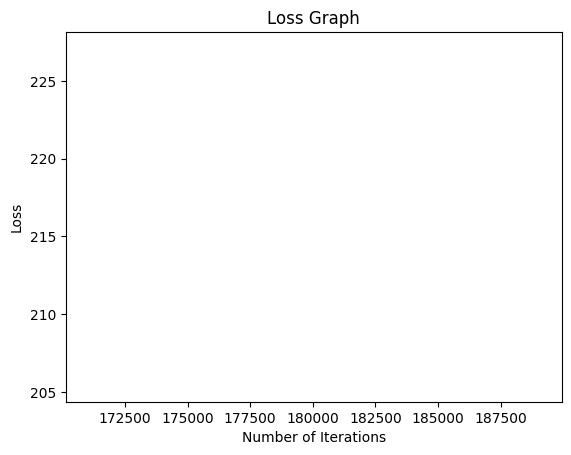

The learning Rate: 0.0001, The iterations: 50000, The accuracy: 57.97%
[nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan

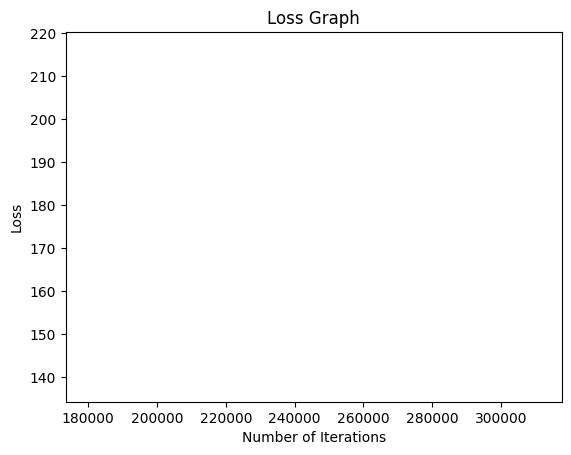

The learning Rate: 1e-05, The iterations: 100000, The accuracy: 95.94%
[nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan

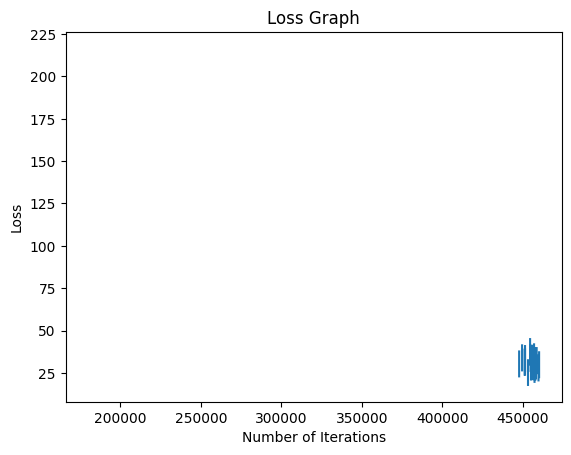

The learning Rate: 1e-05, The iterations: 30000, The accuracy: 93.62%
[nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,

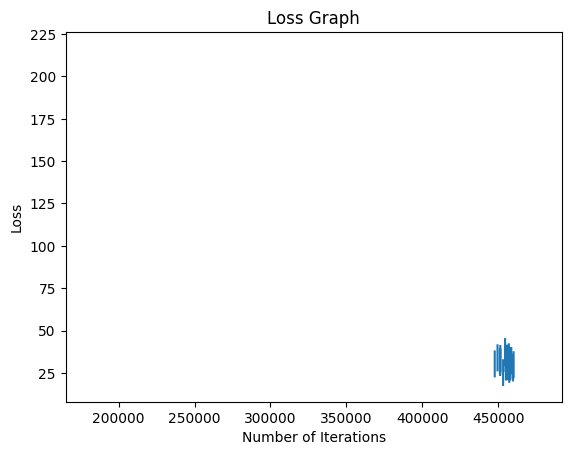

The learning Rate: 1e-05, The iterations: 50000, The accuracy: 77.10%
[nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,

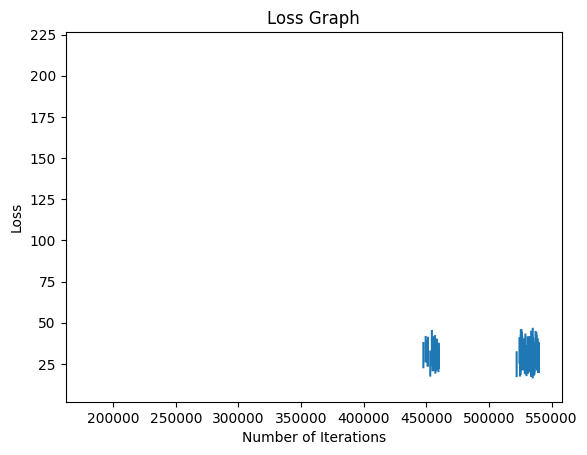

97.10144927536231
[[22.02763254 22.01295499 22.09492324 22.02317531 22.01964797]
 [13.11724662 13.24835515 13.1393506  13.18207802 13.12136203]
 [-1.66253958 -1.82662834 -2.8091826  -1.66551813 -1.6308853 ]
 [ 4.58031888  4.56986902  4.57961652  4.57542058  4.58371554]
 [14.14311508 14.19088738 14.07457581 14.16803487 14.13912017]]


In [144]:
loss_values = []

class LogitRegression():

  def __init__(self, learning_rate=0.001, iterations=1000):
    self.learning_rate = learning_rate
    self.iterations = iterations
    self.weights = None
    self.bias = None

  def sigmoid(self, z):
    sigmaFunc = 1 / (1 + np.exp(-z))
    return sigmaFunc

  def cost(self, y, h, n):
    N = n
    objective_function = -(1/N) * np.sum(((y) * np.log(h)) + [(1-y) * np.log(1 - h)])
    # objective_function =-np.mean(y * np.log(h) + (1 - y) * np.log(1 - h))
    return objective_function

  def gradient_descent(self, X, y, h, n):
    N = n  # X.shape[0]
    delta =  h - y   # h= sigmoid(w.X + b), pred = h
    dW = np.dot(X.T, delta) / N
    self.weights -= self.learning_rate * dW
    # self.bias -= self.learning_rate * np.mean(delta)

  def fit(self, X, y,n):
    N = n #X.shape
    self.weights = np.random.uniform(0,1)   #(0, 1, size=(d, 1))
    self.bias = 0.1

    # loss_values = []

    for i in range(self.iterations):
      z = np.dot(X,self.weights) + self.bias  #value for z in sigmod function
      h = self.sigmoid(z)
      self.gradient_descent(X, y, h, N)
      loss_values.append(self.cost(y, h, N))

  def predict(self, X):
    z = np.dot(X, self.weights) + self.bias
    h = self.sigmoid(z)
    return np.where(h >= 0.5, 1, 0)

#Train the model
learning_rates = [1e-3, 1e-4, 1e-5]
iterations = [100000, 30000, 50000]
best_accuracy = 0
good_weights = None

for rate in learning_rates:
  for iter in iterations:
    model = LogitRegression(learning_rate=rate, iterations=iter)
    model.fit(X_train, y_train,X.shape[0])

    predictions = model.predict(X_test)
    accuracy = np.mean(predictions == y_test) * 100

    print(f"The learning Rate: {rate}, The iterations: {iter}, The accuracy: {accuracy:.2f}%")

    if accuracy > best_accuracy:
      best_accuracy = accuracy
      good_weights = model.weights

    # Plot loss graph
    plt.plot(loss_values)
    print(loss_values)
    plt.xlabel("Number of Iterations")
    plt.ylabel("Loss")
    plt.title("Loss Graph")
    plt.show()

print(best_accuracy)
print(good_weights)



In [154]:
pickle.dump( good_weights, open( "Rebecca_Abraham_assignment1_part2.p", "wb" ) )

[nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,

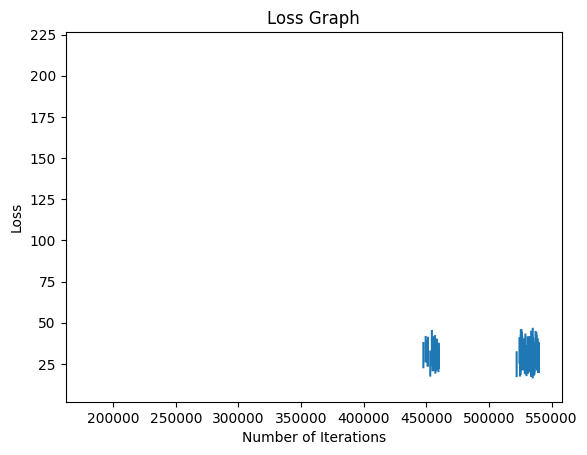

In [153]:
# Plot loss graph
plt.plot(loss_values)
print(loss_values)
plt.xlabel("Number of Iterations")
plt.ylabel("Loss")
plt.title("Loss Graph")
plt.show()


In [146]:
categorical_data.to_csv('penguins_preprocessed.csv')

# References

In [147]:
# For text preprocessing:
# https://www.analyticsvidhya.com/blog/2022/01/text-cleaning-methods-in-nlp/

In [148]:
# For catplot:
# https://seaborn.pydata.org/generated/seaborn.swarmplot.html

In [149]:
# For removing outliers:
# https://medium.com/analytics-vidhya/removing-outliers-understanding-how-and-what-behind-the-magic-18a78ab480ff

In [150]:
# For correlation matrix:
# https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.corr.html

In [151]:
# To replace missing data:
# https://www.geeksforgeeks.org/working-with-missing-data-in-pandas/

In [152]:
# For understanding logistic regression:
# https://medium.com/@koushikkushal95/logistic-regression-from-scratch-dfb8527a4226

# https://www.geeksforgeeks.org/implementation-of-logistic-regression-from-scratch-using-python/